# **Para as questões 1-4 usaremos apenas os vinhos do tipo "branco".**

## <font color="Blue">**Cada etapa deste projeto está baseada na metodologia CRISP-DM**.

In [15]:
# Importação das bibliotecas necessárias para analisar/transformar os dados
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.svm import SVC
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_curve, roc_auc_score, auc, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold, train_test_split

warnings.filterwarnings('ignore')

## <font color="Blue">**Etapa 1: Assumindo que a etapa de Business understand já foi feita, começaremos com Data understanding.**

# **Questão 1. Faça o download da base - esta é uma base real, apresentada no artigo:**
# **P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis. Modeling wine preferences by data mining from physicochemical properties. In Decision Support Systems, Elsevier, 47(4):547-553, 2009.**

# **Ela possui uma variável denominada "quality", uma nota de 0 a 10 que denota a qualidade do vinho. Crie uma nova variável, chamada "opinion" que será uma variável categórica igual à 0, quando quality for menor e igual à 5. O valor será 1, caso contrário. Desconsidere a variável quality para o restante da análise.**

In [4]:
# Download da base
df_wine = pd.read_csv('winequalityN.csv')
df_wine.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [5]:
# Separando a variável: vinho branco 
df_white = df_wine.drop(df_wine.index[df_wine['type'] == 'red'])
df_white.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [6]:
# Criando a variável opinion e removendo a variável quality
df_white['opinion'] = df_white['quality'].apply(lambda x: 0 if x <= 5 else 1)
df_white = df_white.drop(['quality'],axis=1)
df_white.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,1
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,1
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,1
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,1
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,1


## **Análise exploratória de dados**

# **Questão 2. Descreva as variáveis presentes na base. Quais são as variáveis? Quais são os tipos de variáveis (discreta, categórica, contínua)? Quais são as médias e desvios padrões?**

**Como vamos tratar inicialmente somente os vinhos brancos, não faz sentido manter a coluna "type", portanto ela também será removida.**

In [7]:
# Excluindo variável "type"
df_white = df_white.drop(['type'],axis=1)

 ## **<center>Dicionário de dados**

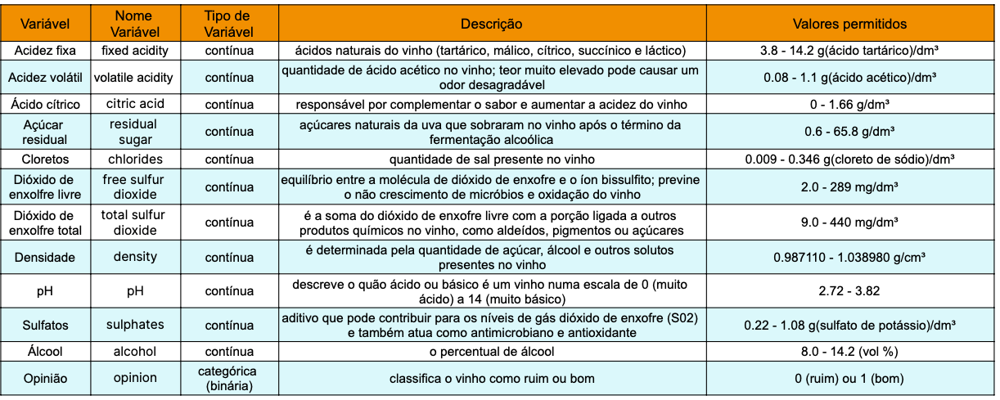

**Segue abaixo o total de obervações de cada variável, as médias, os desvios padrões, o limite inferior, o primeiro quartil, o segundo quartil (mediana), o terceiro quartil e o limite superior.**

In [8]:
# Estatística descritiva
df_white.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,4890.0,6.855532,0.843808,3.80000,6.300000,6.80000,7.3000,14.20000
volatile acidity,4891.0,0.278252,0.100811,0.08000,0.210000,0.26000,0.3200,1.10000
citric acid,4896.0,0.334250,0.120985,0.00000,0.270000,0.32000,0.3900,1.66000
residual sugar,4896.0,6.393250,5.072275,0.60000,1.700000,5.20000,9.9000,65.80000
chlorides,4896.0,0.045778,0.021850,0.00900,0.036000,0.04300,0.0500,0.34600
free sulfur dioxide,4898.0,35.308085,17.007137,2.00000,23.000000,34.00000,46.0000,289.00000
total sulfur dioxide,4898.0,138.360657,42.498065,9.00000,108.000000,134.00000,167.0000,440.00000
density,4898.0,0.994027,0.002991,0.98711,0.991723,0.99374,0.9961,1.03898
pH,4891.0,3.188203,0.151014,2.72000,3.090000,3.18000,3.2800,3.82000
sulphates,4896.0,0.489835,0.114147,0.22000,0.410000,0.47000,0.5500,1.08000


In [9]:
# Informações sobre o data frame
df_white.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4890 non-null   float64
 1   volatile acidity      4891 non-null   float64
 2   citric acid           4896 non-null   float64
 3   residual sugar        4896 non-null   float64
 4   chlorides             4896 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4891 non-null   float64
 9   sulphates             4896 non-null   float64
 10  alcohol               4898 non-null   float64
 11  opinion               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [10]:
# Verificando se há linhas duplicadas
dupli = df_white[df_white.duplicated()]
dupli

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
4,7.2,0.23,0.32,8.50,0.058,47.0,186.0,0.99560,3.19,0.40,9.900000,1
5,8.1,0.28,0.40,6.90,0.050,30.0,97.0,0.99510,3.26,0.44,10.100000,1
7,7.0,0.27,0.36,20.70,0.045,45.0,170.0,1.00100,3.00,0.45,8.800000,1
8,6.3,0.30,0.34,1.60,0.049,14.0,132.0,0.99400,3.30,0.49,9.500000,1
39,7.3,0.24,0.39,17.95,0.057,45.0,149.0,0.99990,3.21,0.36,8.600000,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4828,6.4,0.23,0.35,10.30,0.042,54.0,140.0,0.99670,3.23,0.47,9.200000,0
4850,7.0,0.36,0.35,2.50,0.048,67.0,161.0,0.99146,3.05,0.56,11.100000,1
4851,6.4,0.33,0.44,8.90,0.055,52.0,164.0,0.99488,3.10,0.48,9.600000,0
4856,7.1,0.23,0.39,13.70,0.058,26.0,172.0,0.99755,2.90,0.46,9.000000,1


In [11]:
# Verificando dados faltantes
missing_data = df_white.isna().sum()
missing_data

fixed acidity           8
volatile acidity        7
citric acid             2
residual sugar          2
chlorides               2
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      7
sulphates               2
alcohol                 0
opinion                 0
dtype: int64

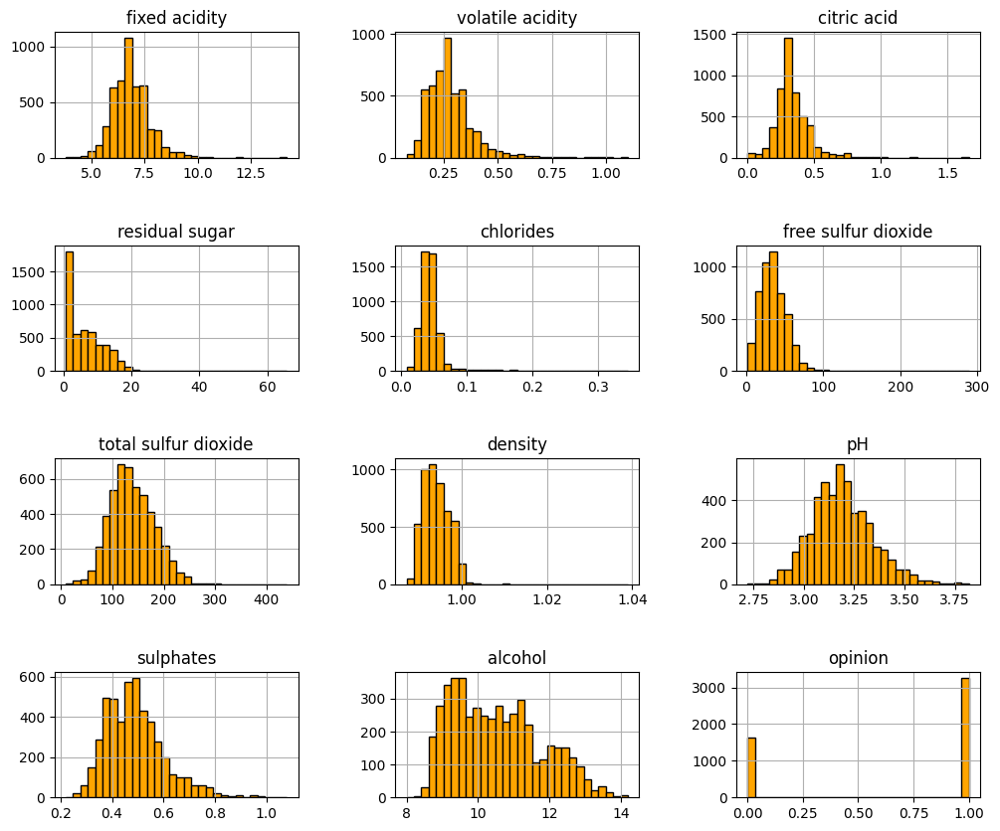

In [12]:
# Histogramas
df_white.hist(figsize=(12, 10), bins=30, edgecolor="black",color='orange')
plt.subplots_adjust(hspace=0.7, wspace=0.4)

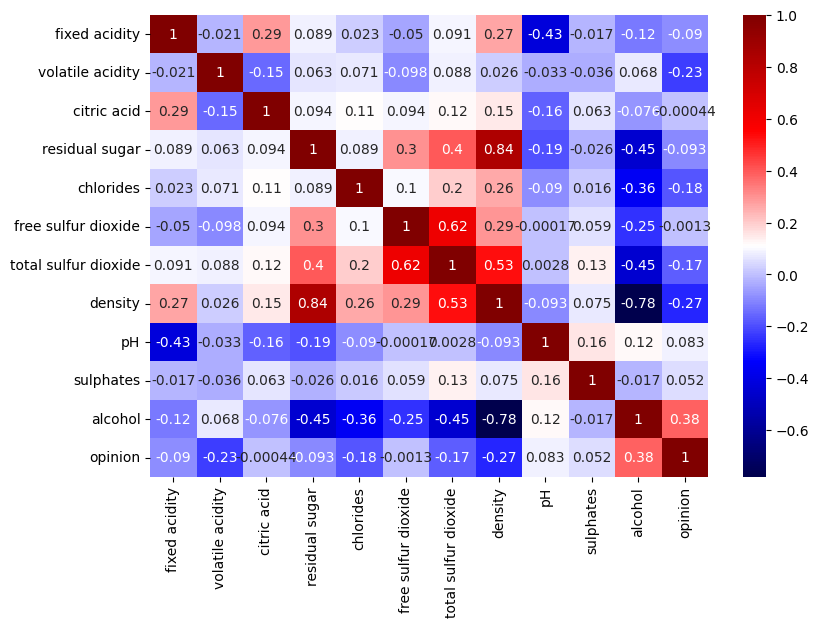

In [13]:
# Análise das correlações
plt.figure(figsize=(9,6))
sns.heatmap(df_white.corr(),annot=True,cmap='seismic')
plt.show()

**Observa-se que os pares de variáveis "density"/"residual sugar" e "density"/"alcohol" possuem correlação forte, sendo negativa o último par. Correlações fortes quando analisadas pela ótica da multicolinearidade podem trazer alguns problemas ao modelo. Há algumas formas de identificar a multicolinearidade, como por exemplo: valores altos do coeficiente de correlação; grandes alterações dos coeficientes de regressão - quando adicionamos ou removemos uma variável independente, ou quando há mudanças ou exclusões de observações no modelo; dentre outras. Uma das formas mais comuns para detectar a multicolinearidade é por meio do fator de inflação da variância (VIF). E como resolver este impasse? Alguns métodos são utilizados, como por exemplo: 1) a remoção de uma ou mais variáveis independentes que estejam altamente correlacionadas e identificar outras variáveis independentes para ajudar na previsão. Obviamente procedimentos como este não devem ser feitos à revelia, pois podemos perder informações importantes contidas nas variáveis removidas; 2) ACP (Análise de Componentes Principais); 3) AF (Análise Fatorial); dentre outros.**

**Cabe ressaltar que este tipo de abordagem não será feita neste projeto.**

<Figure size 1500x800 with 0 Axes>

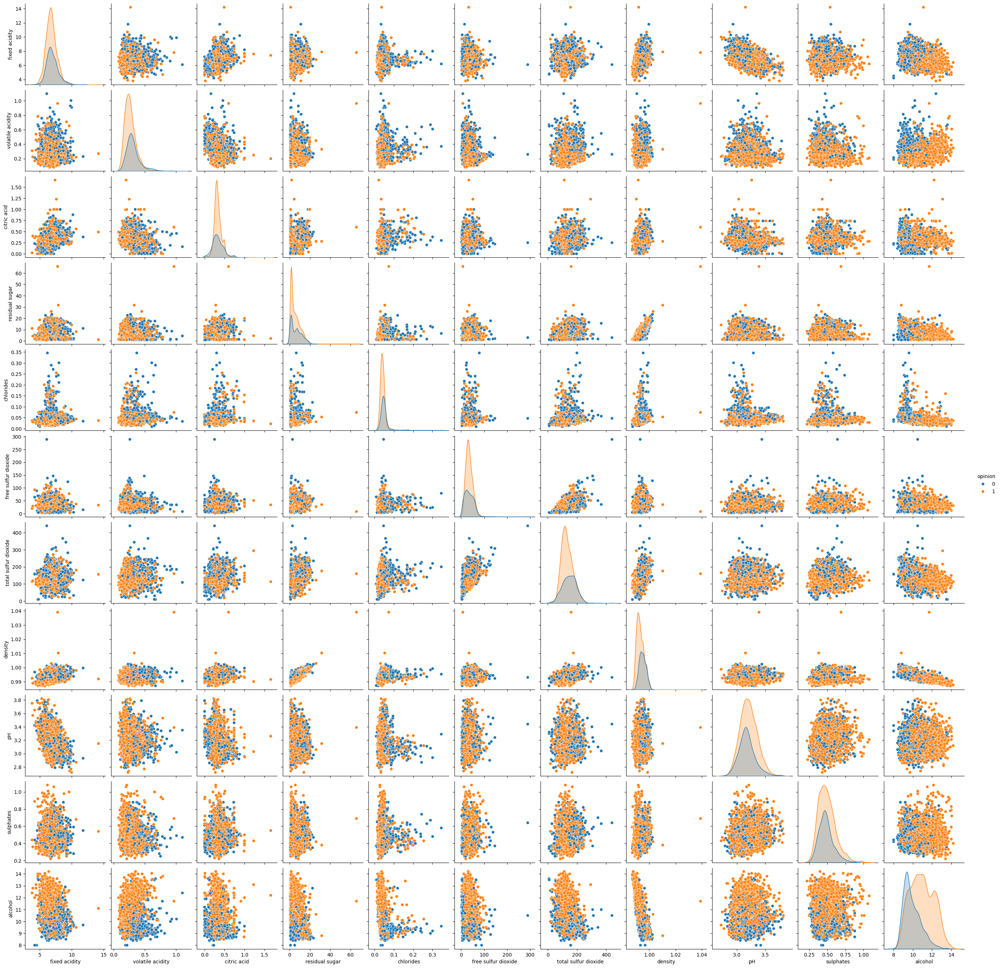

In [352]:
# Análise do gráfico de dispersão aos pares
plt.figure(figsize=(15,8))
df_white[['fixed acidity','volatile acidity','citric acid','residual sugar','chlorides','free sulfur dioxide','total sulfur dioxide','density','pH','sulphates','alcohol','opinion']]
sns.pairplot(df_white, hue='opinion')
plt.show()


**Observações estatísticas, mas que também não serão implementadas neste projeto:**

 **Apenas com a simples inspeção do gráficos acima não dá para afirmar que cada variável tem influência direta na qualidade do vinho. Para isso cabe o teste do qui-quadrado, que vai analisar estatisticamente se há ou não correlação entre a variável dependente e as variáveis independentes.**

**Agora vamos separar duas categorias de boxplots para uma melhor visualização. Uma com pequeno intervalo de valores e outra com um intervalo maior.**

**Primeira categoria**

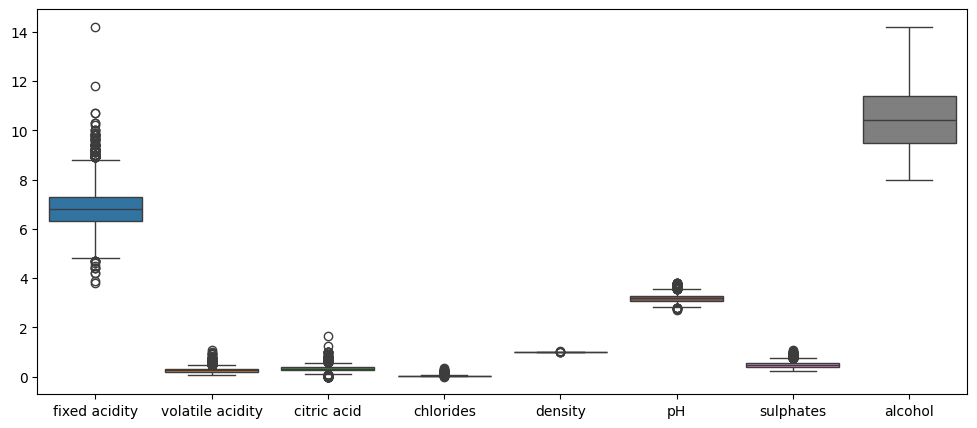

In [293]:
df_select_low_nums_white_1 = df_white[['fixed acidity','volatile acidity','citric acid','chlorides','density','pH','sulphates','alcohol']]
plt.figure(figsize=(12,5))
sns.boxplot(df_select_low_nums_white_1)
plt.show()

**Segunda categoria**

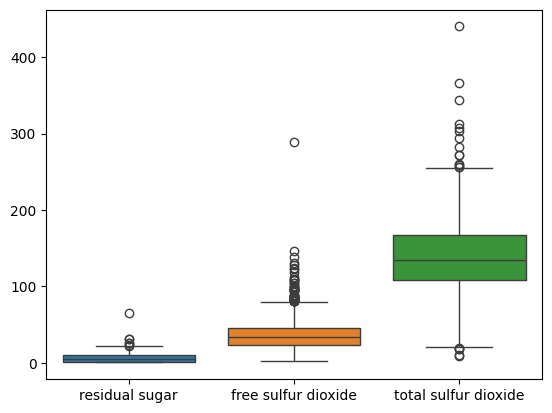

In [294]:
df_select_high_nums_white_1 = df_white[['residual sugar','free sulfur dioxide', 'total sulfur dioxide']]
sns.boxplot(df_select_high_nums_white_1)
plt.show()

## <font color="Blue">**Etapa 2: Data preparation**

**Vamos começar o tratamento dos dados.** 

**Dados duplicados podem gerar: viés nos resultados, overfitting, dificuldades para interpretar o modelo, ineficiência computacional e validação cruzada, portanto, vamos excluí-los.**


In [295]:
# Excluindo dados duplicados
df_white = df_white.drop_duplicates().reset_index(drop=True)
df_white

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3965,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3966,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3967,6.5,NaN,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,1
3968,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


In [296]:
df_white[df_white.isnull().any(axis=1)]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
13,NaN,0.660,0.48,1.2,0.029,29.0,75.0,0.98920,3.33,0.39,12.8,1
29,6.2,0.120,0.34,NaN,0.045,43.0,117.0,0.99390,3.42,0.51,9.0,1
48,6.8,0.200,0.59,0.9,0.147,38.0,132.0,0.99300,NaN,0.38,9.1,1
76,7.2,NaN,0.63,11.0,0.044,55.0,156.0,0.99740,3.09,0.44,8.7,1
86,9.8,0.360,0.46,10.5,NaN,4.0,83.0,0.99560,2.89,0.30,10.1,0
120,8.1,0.280,0.39,1.9,0.029,18.0,79.0,0.99230,NaN,0.52,11.8,1
149,NaN,0.270,0.31,17.7,0.051,33.0,173.0,0.99900,3.09,0.64,10.2,0
192,6.3,0.495,0.22,1.8,0.046,31.0,140.0,0.99290,3.39,NaN,10.4,1
212,NaN,0.410,0.14,10.4,0.037,18.0,119.0,0.99600,3.38,0.45,10.0,0
227,NaN,0.580,0.07,6.9,0.043,34.0,149.0,0.99440,3.34,0.57,9.7,0


In [297]:
# Excluindo dados faltantes
df_white = df_white.dropna()
df_white = df_white.reset_index(drop=True)
df_white

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


**Aqui foi adotado a seguinte prescrição: temos um total de 30 dados faltantes que representam 0,7% da amostra total de vinhos brancos, portanto optamos em excluir estes dados, já que as análises descritivas antes e depois da remoção ficaram praticamente inalteradas.
Além disso, foi escolhido não substituir os valores faltantes por zero, ou pela média, ou pela mediana ou pelo valor mais repetido da respectiva porque poderia gerar um grau de enviesamento quando o modelo fosse testado para outro tipo de vinho.**

**Ao excluir os dados duplicados o dataset ficou com  3970 observações. Em seguida vimos que temos 30 dados faltantes, portanto, ao excluí-los o resultado deveria ser 3940, porém, conforme mostramos acima temos 3942 linhas. Isso ocorre porque existem mais de 2 linhas com NaN, logo, na verdade são 28 dados deste tipo.**

In [298]:
# Análise descritiva - estatísticas básicas após tratamento dos dados
df_white.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,3942.0,6.840297,0.866067,3.80000,6.3000,6.8000,7.30000,14.20000
volatile acidity,3942.0,0.280430,0.103256,0.08000,0.2100,0.2600,0.32875,1.10000
citric acid,3942.0,0.334490,0.122404,0.00000,0.2700,0.3200,0.39000,1.66000
residual sugar,3942.0,5.918721,4.861389,0.60000,1.6000,4.7000,8.87500,65.80000
chlorides,3942.0,0.045887,0.023088,0.00900,0.0350,0.0420,0.05000,0.34600
free sulfur dioxide,3942.0,34.918062,17.227540,2.00000,23.0000,33.0000,45.00000,289.00000
total sulfur dioxide,3942.0,137.215753,43.128509,9.00000,106.0000,133.0000,166.00000,440.00000
density,3942.0,0.993788,0.002907,0.98711,0.9916,0.9935,0.99571,1.03898
pH,3942.0,3.195287,0.151345,2.72000,3.0900,3.1800,3.29000,3.82000
sulphates,3942.0,0.490236,0.113653,0.22000,0.4100,0.4800,0.55000,1.08000


**Analisando os boxplots, precisaremos tratar alguns outliers. Para justificar a exclusão destes valores referentes à variável 'fixed acidity', tomamos como base a referência: https://www.randoxfood.com/why-is-testing-for-tartaric-acid-important-in-wine-making/ . A acidez fixa, expressa em g/dm3 de ácido tartárico, deve estar dentro do intervalo de 0.5 a 10 g/dm3.**

In [299]:
df_select = df_white[(df_white['fixed acidity'] >= 10)]
df_white_1 = df_white.drop(df_select.index)
df_white_1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


**De acordo com https://www.ivv.gov.pt/np4/89/ o ácido cítrico deve ter valor máximo igual a 1 g/dm3, portanto também removeremos esses outliers.**

In [300]:
df_select_1 = df_white_1[(df_white_1['citric acid'] > 1)]
df_white_2 = df_white_1.drop(df_select_1.index)
df_white_2

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


**Podemos ver também que a quantidade de "free sulfur dioxide" e "total sulfur dioxide" possuem valores acima do limite permitido para o vinho branco. Veja as referências:**
**https://www.ivv.gov.pt/np4/89/**
**https://www.oiv.int/public/medias/7840/oiv-collective-expertise-document-so2-and-wine-a-review.pdf**
**https://diariodarepublica.pt/dr/detalhe/portaria/610-1972-690063**

**Assim, todos os valores fora dos intervalos abaixo serão considerados outliers e posteriormente excluídos.**

**- quando "residual sugar" >= 5 mg/dm3 --> "total sulfur dioxide" deve assumir valores <= 250 mg/dm3;**

**- quando "residual sugar" < 5 mg/dm3--> "total sulfur dioxide" deve assumir valores <= 200 mg/dm3;** 

**- "free sulfur dioxide" <= 70 mg/dm3.**

**Também foi observado uma ocorrência de dois outliers fora do limite inferior na coluna 'total sulfur dioxide', respectivamente iguais a 9 mg/dm3 e 10 mg/dm3, como são apenas dois valores, eles serão removidos.**

In [301]:
df_select_2 = df_white_2[(df_white_2['residual sugar'] >= 5) & (df_white_2['total sulfur dioxide'] > 250)]
df_white_3 = df_white_2.drop(df_select_2.index)
df_white_3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


In [302]:
df_select_3 = df_white_3[(df_white_3['residual sugar'] < 5 ) & (df_white_3['total sulfur dioxide'] > 200)]
df_white_4 = df_white_3.drop(df_select_3.index)
df_white_4

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


In [303]:
df_select_4 = df_white_4[(df_white_4['free sulfur dioxide'] > 77)]
df_white_5 = df_white_4.drop(df_select_4.index)
df_white_5


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


In [304]:
df_select_5 = df_white_5[(df_white_5['total sulfur dioxide'] <= 10)]
df_white_6 = df_white_5.drop(df_select_5.index)
df_white_6

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


**Apesar de existirem vinhos com açúcar residual igual a 31.6 g/dm3 e 65.8 g/cm3, podemos ver que somente 2 vinhos possuem estes valores, o que representa 0,05%, portanto, não faz sentido mantê-lo na análise já que eles se comportam como valores bem discrepantes.**

In [305]:
df_select_6 = df_white_6[(df_white_6['residual sugar'] >= 31.6)]
df_white_final = df_white_6.drop(df_select_6.index)
df_white_final

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,opinion
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3937,5.7,0.21,0.32,0.9,0.038,38.0,121.0,0.99074,3.24,0.46,10.6,1
3938,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1
3939,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,0
3940,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1


**Novos boxplot após os dados terem sido tratados.**

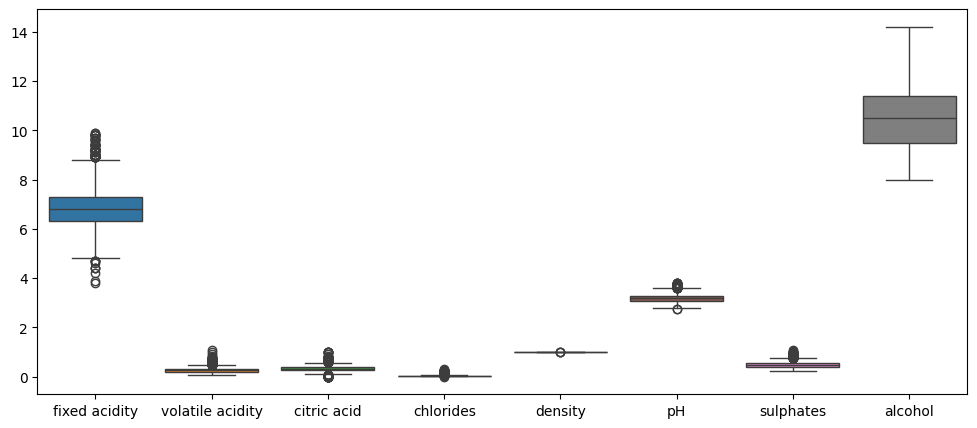

In [306]:
df_select_low_nums_white_2= df_white_final[['fixed acidity','volatile acidity','citric acid','chlorides','density','pH','sulphates','alcohol']]
plt.figure(figsize=(12,5))
sns.boxplot(df_select_low_nums_white_2)
plt.show()

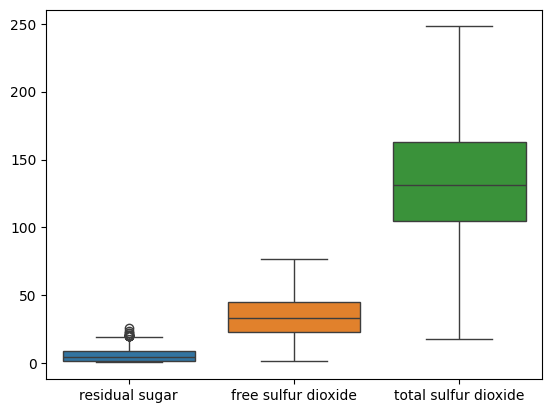

In [307]:
df_select_high_nums_white_2 = df_white_final[['residual sugar','free sulfur dioxide', 'total sulfur dioxide']]
sns.boxplot(df_select_high_nums_white_2)
plt.show()

**Novos histogramas**

**Observe como algumas distribuições se aproximaram ainda mais de uma normal quando fizemos o tratamento dos dados.**

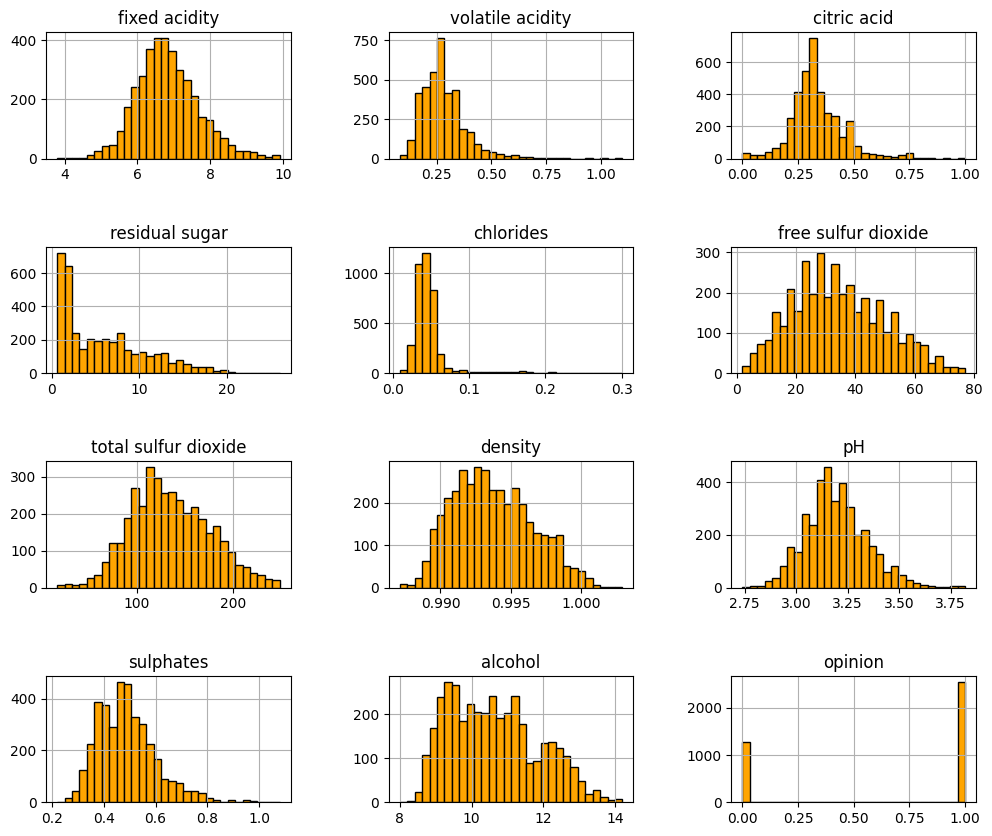

In [308]:
df_white_final.hist(figsize=(12, 10), bins=30, edgecolor="black",color='orange')
plt.subplots_adjust(hspace=0.7, wspace=0.4)


 **Mesmo com algumas melhorias, ainda não podemos afirmar se há influência individual de cada variável na qualidade do vinho.**

<Figure size 1500x800 with 0 Axes>

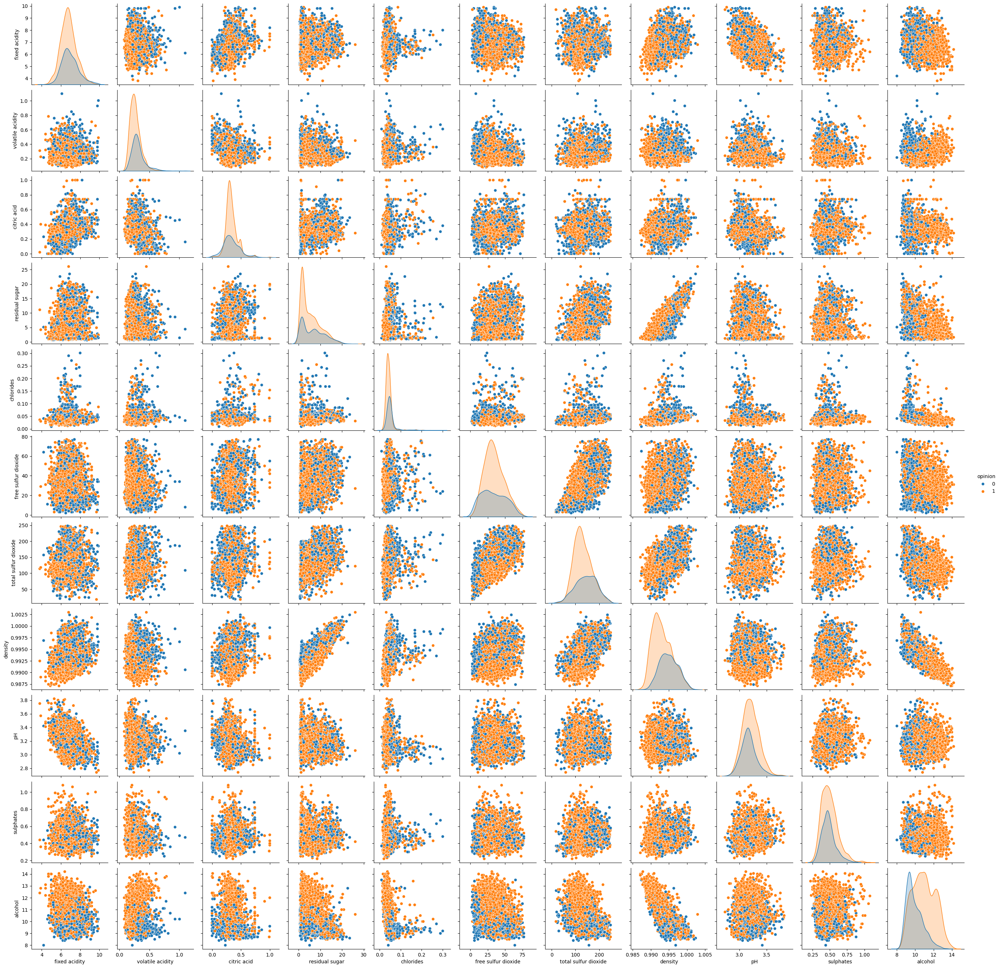

In [353]:
plt.figure(figsize=(15,8))
df_white_final[['fixed acidity','volatile acidity','citric acid','residual sugar','chlorides','free sulfur dioxide','total sulfur dioxide','density','pH','sulphates','alcohol','opinion']]
sns.pairplot(df_white_final, hue='opinion')
plt.show()

# **Questão 3. Com a base escolhida:**

# **Descreva as etapas necessárias para criar um modelo de classificação eficiente.**
# **Treine os modelos de: regressão logística, árvore de decisão e SVM usando um modelo de validação cruzada estratificada com k-folds (k=10) para realizar a classificação. Calcule para a base de teste:**
# **i. a média e desvio da acurácia dos modelos obtidos;**
# **ii. a média e desvio da precisão dos modelos obtidos;**
# **iii. a média e desvio da recall dos modelos obtidos;**
# **iv. a média e desvio do f1-score dos modelos obtidos.**


## <font color="Blue">**Etapa 3 : Modeling**

In [310]:
# Atribuição  da variável target
x = df_white_final.drop(['opinion'], axis=1)
y = df_white_final[['opinion']]

# Separação treino e teste
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, stratify=y, random_state=10)

In [311]:
# Pipelines
logreg = Pipeline([
    ('scaler', MinMaxScaler()),
    ('model', LogisticRegression(solver='saga'))
])
dt = Pipeline([
    ('scaler', MinMaxScaler()),
    ('model', DecisionTreeClassifier(random_state=10))
])
svm = Pipeline([
    ('scaler', MinMaxScaler()),
    ('model', SVC(probability=True,random_state=10))
])

In [312]:
# Ajuste do pipeline - regressão logística
logreg.fit(x_train, y_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', LogisticRegression(solver='saga'))])

In [313]:
# Ajuste do pipeline - árvore de decisão
dt.fit(x_train, y_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', DecisionTreeClassifier(random_state=10))])

In [314]:
# Ajuste do pipeline - svm
svm.fit(x_train, y_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', SVC(probability=True, random_state=10))])

In [315]:
# Amostrador de k-folhas
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=10)

In [316]:
# Parâmetros de busca
params_logreg = {
    'model__penalty': ['l1', 'l2', None],
    'model__C': np.random.uniform(0.01, 10, 100),
}

params_dt = {
    'model__criterion': ['gini', 'entropy'],
    'model__max_depth': range(2, 11)
}

params_svc = {
    'model__kernel': ['rbf', 'sigmoid', 'cosine', 'linear'],
    'model__C': np.random.uniform(0.01, 10, 100),
    'model__gamma': np.random.uniform(0.01, 10, 100)
}

In [317]:
# Buscador de hiperparâmetros
random_search_logreg = RandomizedSearchCV(
    estimator=logreg,
    param_distributions=params_logreg,
    n_iter=10,
    scoring='f1_weighted',
    cv=cv,
    refit=True,
    error_score=0
)

random_search_dt = RandomizedSearchCV(
    estimator=dt,
    param_distributions=params_dt,
    n_iter=10,
    scoring='f1_weighted',
    cv=cv,
    refit=True,
    error_score=0
)

random_search_svc = RandomizedSearchCV(
    estimator=svm,
    param_distributions=params_svc,
    n_iter=10,
    scoring='f1_weighted',
    cv=cv,
    refit=True,
    error_score=0
)

In [318]:
# Ajuste do modelo de regressão logística
random_search_logreg.fit(x_train, y_train)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=10, shuffle=True),
                   error_score=0,
                   estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                             ('model',
                                              LogisticRegression(solver='saga'))]),
                   param_distributions={'model__C': array([1.1275004 , 8.39929944, 6.85747503, 8.01209714, 6.22215955,
       7.4485853 , 5.78004343, 0.58261901, 7.45361867, 6.93910745,
       6.57408003,...
       0.54083555, 2.94550456, 2.75213188, 7.86192013, 4.9849941 ,
       3.6285217 , 7.54500795, 9.8599748 , 6.72665184, 3.12054386,
       5.69207788, 2.38691299, 2.40813798, 2.43462764, 8.04329139,
       5.38960678, 9.69702918, 3.04383429, 2.49235533, 6.71694152,
       3.37840286, 2.348796  , 0.19030934, 5.71922249, 6.79227722,
       9.32549448, 7.64367103, 6.25841163, 8.21207861, 1.95904369]),
                                        'model__penalty': ['l1', 'l2', None]},
                   scoring='f1_weighted')

In [319]:
# Ajuste do modelo de árvore de decisão
random_search_dt.fit(x_train, y_train)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=10, shuffle=True),
                   error_score=0,
                   estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                             ('model',
                                              DecisionTreeClassifier(random_state=10))]),
                   param_distributions={'model__criterion': ['gini', 'entropy'],
                                        'model__max_depth': range(2, 11)},
                   scoring='f1_weighted')

In [320]:
# Ajuste do modelo de svm
random_search_svc.fit(x_train, y_train)


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=10, shuffle=True),
                   error_score=0,
                   estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                             ('model',
                                              SVC(probability=True,
                                                  random_state=10))]),
                   param_distributions={'model__C': array([6.04508141, 3.87324307, 5.2429839 , 4.35455666, 0.2977758 ,
       3.36998929, 9.13588426, 5.70171008, 7.84607162, 4.36445869,
       2.04517...
       7.92930861, 3.06875126, 6.76123751, 7.93090165, 6.31709594,
       2.2536751 , 4.27140276, 6.18523332, 1.88202266, 8.96594132,
       3.26573172, 6.94551882, 0.32681737, 0.52508432, 2.67174859,
       2.65989368, 6.84474541, 6.55378171, 7.17663136, 1.98471071,
       0.23540201, 5.57993128, 1.38094024, 4.69591467, 5.69797934]),
                                        'model__kernel': ['rbf', 'sigmoid',
                                                          'cosine', 'linear']},
                   scoring='f1_weighted')

## <font color="Blue"> **Etapa 4: Evaluation**

In [321]:
# Melhores parâmetros
print('Regressão Logística:', random_search_logreg.best_params_)
print('Árvore de Decisão:', random_search_dt.best_params_)
print('SVM:', random_search_svc.best_params_)

Regressão Logística: {'model__penalty': None, 'model__C': 0.46851662611137107}
Árvore de Decisão: {'model__max_depth': 4, 'model__criterion': 'entropy'}
SVM: {'model__kernel': 'rbf', 'model__gamma': 1.9847107119563787, 'model__C': 9.959456311684797}


In [322]:
# Melhores desempenhos médios
print('Regressão Logística:', random_search_logreg.best_score_)
print('Árvore de Decisão:', random_search_dt.best_score_)
print('SVM:', random_search_svc.best_score_)

Regressão Logística: 0.7326015719594247
Árvore de Decisão: 0.7318767518590616
SVM: 0.7691141839890187


In [323]:
random_search_logreg

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=10, shuffle=True),
                   error_score=0,
                   estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                             ('model',
                                              LogisticRegression(solver='saga'))]),
                   param_distributions={'model__C': array([1.1275004 , 8.39929944, 6.85747503, 8.01209714, 6.22215955,
       7.4485853 , 5.78004343, 0.58261901, 7.45361867, 6.93910745,
       6.57408003,...
       0.54083555, 2.94550456, 2.75213188, 7.86192013, 4.9849941 ,
       3.6285217 , 7.54500795, 9.8599748 , 6.72665184, 3.12054386,
       5.69207788, 2.38691299, 2.40813798, 2.43462764, 8.04329139,
       5.38960678, 9.69702918, 3.04383429, 2.49235533, 6.71694152,
       3.37840286, 2.348796  , 0.19030934, 5.71922249, 6.79227722,
       9.32549448, 7.64367103, 6.25841163, 8.21207861, 1.95904369]),
                                        'model__penalty': ['l1', 'l2', None]},
                   scoring='f1_weighted')

In [324]:
# Desempenho final - regressão logística
# Novas previsões
ypred_white_train_logreg = random_search_logreg.best_estimator_.predict(x_train)
ypred_white_test_logreg = random_search_logreg.best_estimator_.predict(x_test)

# Análise do desempenho
print('Desempenho - Base de Treino - Regressão Logística')
print(classification_report(y_train, ypred_white_train_logreg))

print('Desempenho - Base de Teste - Regressão Logística')
print(classification_report(y_test, ypred_white_test_logreg))

Desempenho - Base de Treino - Regressão Logística
              precision    recall  f1-score   support

           0       0.66      0.51      0.57      1026
           1       0.78      0.87      0.82      2038

    accuracy                           0.75      3064
   macro avg       0.72      0.69      0.70      3064
weighted avg       0.74      0.75      0.74      3064

Desempenho - Base de Teste - Regressão Logística
              precision    recall  f1-score   support

           0       0.70      0.51      0.59       257
           1       0.78      0.89      0.83       510

    accuracy                           0.76       767
   macro avg       0.74      0.70      0.71       767
weighted avg       0.76      0.76      0.75       767



In [325]:
# Desempenho final - árvore de decisão
# Novas previsões
ypred_white_train_dt = random_search_dt.best_estimator_.predict(x_train)
ypred_white_test_dt = random_search_dt.best_estimator_.predict(x_test)

# Análise do desempenho
print('Desempenho - Base de Treino - Árvore de Decisão')
print(classification_report(y_train, ypred_white_train_dt))

print('Desempenho - Base de Teste - Árvore de Decisão')
print(classification_report(y_test, ypred_white_test_dt))

Desempenho - Base de Treino - Árvore de Decisão
              precision    recall  f1-score   support

           0       0.65      0.60      0.62      1026
           1       0.80      0.84      0.82      2038

    accuracy                           0.76      3064
   macro avg       0.73      0.72      0.72      3064
weighted avg       0.75      0.76      0.75      3064

Desempenho - Base de Teste - Árvore de Decisão
              precision    recall  f1-score   support

           0       0.69      0.62      0.66       257
           1       0.82      0.86      0.84       510

    accuracy                           0.78       767
   macro avg       0.76      0.74      0.75       767
weighted avg       0.78      0.78      0.78       767



In [326]:
# Desempenho final - SVM
# Novas previsões
ypred_white_train_svm = random_search_svc.best_estimator_.predict(x_train)
ypred_white_test_svm = random_search_svc.best_estimator_.predict(x_test)

# Análise do desempenho
print('Desempenho - Base de Treino - SVM')
print(classification_report(y_train, ypred_white_train_svm))

print('Desempenho - Base de Teste - SVM')
print(classification_report(y_test, ypred_white_test_svm))

Desempenho - Base de Treino - SVM
              precision    recall  f1-score   support

           0       0.76      0.65      0.70      1026
           1       0.84      0.89      0.86      2038

    accuracy                           0.81      3064
   macro avg       0.80      0.77      0.78      3064
weighted avg       0.81      0.81      0.81      3064

Desempenho - Base de Teste - SVM
              precision    recall  f1-score   support

           0       0.74      0.64      0.68       257
           1       0.83      0.89      0.86       510

    accuracy                           0.80       767
   macro avg       0.78      0.76      0.77       767
weighted avg       0.80      0.80      0.80       767



**Agora será calculado as mesmas métricas e qual fold apresenta o melhor resultado em relação à F1-Score, já que para este modelo é mais interessante ter a média harmônica entre a precisão e a recall.**

In [327]:
# Regressão logística 
acc_list_train = []
preci_list_train = []
recall_list_train = []
f1_list_train = []

acc_list_test = []
preci_list_test = []
recall_list_test = []
f1_list_test = []

print(77*'=')
print('                      REGRESSÃO LOGÍSTICA - BASE DE TREINO                             ')
print(77*'=')
for fold, (train_index, test_index) in enumerate(cv.split(x_train, y_train)):
    x_fold_train, x_fold_test = x_train.iloc[train_index], x_train.iloc[test_index]
    y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]

    logreg_pred_train = random_search_logreg.predict(x_fold_train)

    acc_train = accuracy_score(y_fold_train, logreg_pred_train)
    preci_train = precision_score(y_fold_train, logreg_pred_train)
    recall_train = recall_score(y_fold_train, logreg_pred_train)
    f1_train = f1_score(y_fold_train, logreg_pred_train)

    acc_list_train.append(acc_train)
    preci_list_train.append(preci_train)
    recall_list_train.append(recall_train)
    f1_list_train.append(f1_train)

    print(f'Fold {fold} - Acurácia: {acc_train:.3f}; Precisão: {preci_train:.3f}; Recall: {recall_train:.3f}; F1-Score: {f1_train:.3f}')
    
print(77*'=')
    
mean_acc_train = np.mean(acc_list_train)

mean_preci_train = np.mean(preci_list_train)

mean_recall_train = np.mean(recall_list_train)

mean_f1_train = np.mean(f1_list_train)

best_fold = np.argmax(f1_list_train)

print(f'MELHOR FOLD - F1-SCORE: {best_fold}')

                      REGRESSÃO LOGÍSTICA - BASE DE TREINO                             
Fold 0 - Acurácia: 0.748; Precisão: 0.778; Recall: 0.868; F1-Score: 0.821
Fold 1 - Acurácia: 0.744; Precisão: 0.776; Recall: 0.865; F1-Score: 0.818
Fold 2 - Acurácia: 0.752; Precisão: 0.781; Recall: 0.870; F1-Score: 0.823
Fold 3 - Acurácia: 0.744; Precisão: 0.778; Recall: 0.862; F1-Score: 0.818
Fold 4 - Acurácia: 0.743; Precisão: 0.776; Recall: 0.862; F1-Score: 0.817
Fold 5 - Acurácia: 0.745; Precisão: 0.777; Recall: 0.865; F1-Score: 0.819
Fold 6 - Acurácia: 0.745; Precisão: 0.778; Recall: 0.863; F1-Score: 0.818
Fold 7 - Acurácia: 0.744; Precisão: 0.776; Recall: 0.864; F1-Score: 0.818
Fold 8 - Acurácia: 0.750; Precisão: 0.780; Recall: 0.869; F1-Score: 0.822
Fold 9 - Acurácia: 0.746; Precisão: 0.777; Recall: 0.867; F1-Score: 0.819
MELHOR FOLD - F1-SCORE: 2


In [328]:
print(50*'=')
print('   REGRESSÃO LOGÍSTICA - BASE DE TESTE  (MÉDIAS)    ')
print(50*'=')

logreg_pred_test = random_search_logreg.predict(x_fold_test)

acc_test = accuracy_score(y_fold_test, logreg_pred_test)
preci_test = precision_score(y_fold_test, logreg_pred_test)
recall_test = recall_score(y_fold_test, logreg_pred_test)
f1_test = f1_score(y_fold_test, logreg_pred_test)

acc_list_test.append(acc_test)
preci_list_test.append(preci_test)
recall_list_test.append(recall_test)
f1_list_test.append(f1_test)

mean_acc_test = np.mean(acc_list_test)

mean_preci_test = np.mean(preci_list_test)

mean_recall_test = np.mean(recall_list_test)

mean_f1_test = np.mean(f1_list_test)

print(f'Acurácia: {mean_acc_test:.3f}')
print(f'Precisão: {mean_preci_test:.3f}')
print(f'Recall: {mean_recall_test:.3f}')
print(f'F1-Score: {mean_f1_test:.3f}')



   REGRESSÃO LOGÍSTICA - BASE DE TESTE  (MÉDIAS)    
Acurácia: 0.748
Precisão: 0.786
Recall: 0.852
F1-Score: 0.818


In [329]:
# Árvore de decisão
acc_list_train = []
preci_list_train = []
recall_list_train = []
f1_list_train = []

acc_list_test = []
preci_list_test = []
recall_list_test = []
f1_list_test = []

print(77*'=')
print('                        ÁRVORE DE DECISÃO - BASE DE TREINO                             ')
print(77*'=')
for fold, (train_index, test_index) in enumerate(cv.split(x_train, y_train)):
    x_fold_train, x_fold_test = x_train.iloc[train_index], x_train.iloc[test_index]
    y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]

    dt_pred_train = random_search_dt.predict(x_fold_train)

    acc_train = accuracy_score(y_fold_train, dt_pred_train)
    preci_train = precision_score(y_fold_train, dt_pred_train)
    recall_train = recall_score(y_fold_train, dt_pred_train)
    f1_train = f1_score(y_fold_train, dt_pred_train)

    acc_list_train.append(acc_train)
    preci_list_train.append(preci_train)
    recall_list_train.append(recall_train)
    f1_list_train.append(f1_train)

    print(f'Fold {fold} - Acurácia: {acc_train:.3f}; Precisão: {preci_train:.3f}; Recall: {recall_train:.3f}; F1-Score: {f1_train:.3f}')
    
print(77*'=')
    
mean_acc_train = np.mean(acc_list_train)

mean_preci_train = np.mean(preci_list_train)

mean_recall_train = np.mean(recall_list_train)

mean_f1_train = np.mean(f1_list_train)

best_fold = np.argmax(f1_list_train)

print(f'MELHOR FOLD - F1-SCORE: {best_fold}')
    


                        ÁRVORE DE DECISÃO - BASE DE TREINO                             
Fold 0 - Acurácia: 0.757; Precisão: 0.807; Recall: 0.835; F1-Score: 0.821


Fold 1 - Acurácia: 0.756; Precisão: 0.802; Recall: 0.839; F1-Score: 0.820
Fold 2 - Acurácia: 0.760; Precisão: 0.805; Recall: 0.844; F1-Score: 0.824
Fold 3 - Acurácia: 0.753; Precisão: 0.802; Recall: 0.835; F1-Score: 0.818
Fold 4 - Acurácia: 0.757; Precisão: 0.805; Recall: 0.837; F1-Score: 0.821
Fold 5 - Acurácia: 0.757; Precisão: 0.804; Recall: 0.838; F1-Score: 0.821
Fold 6 - Acurácia: 0.757; Precisão: 0.806; Recall: 0.836; F1-Score: 0.821
Fold 7 - Acurácia: 0.755; Precisão: 0.803; Recall: 0.838; F1-Score: 0.820
Fold 8 - Acurácia: 0.756; Precisão: 0.804; Recall: 0.837; F1-Score: 0.820
Fold 9 - Acurácia: 0.753; Precisão: 0.803; Recall: 0.833; F1-Score: 0.818
MELHOR FOLD - F1-SCORE: 2


In [330]:
print(48*'=')
print('    ÁRVORE DE DECISÃO - BASE DE TESTE (MÉDIAS)     ')
print(48*'=')

dt_pred_test = random_search_dt.predict(x_fold_test)
    
acc_test = accuracy_score(y_fold_test, dt_pred_test)
preci_test = precision_score(y_fold_test, dt_pred_test)
recall_test = recall_score(y_fold_test, dt_pred_test)
f1_test = f1_score(y_fold_test, dt_pred_test)

acc_list_test.append(acc_test)
preci_list_test.append(preci_test)
recall_list_test.append(recall_test)
f1_list_test.append(f1_test)

mean_acc_test = np.mean(acc_list_test)

mean_preci_test = np.mean(preci_list_test)

mean_recall_test = np.mean(recall_list_test)

mean_f1_test = np.mean(f1_list_test)

print(f'Acurácia: {mean_acc_test:.3f}')
print(f'Precisão: {mean_preci_test:.3f}')
print(f'Recall: {mean_recall_test:.3f}')
print(f'F1-Score: {mean_f1_test:.3f}')



    ÁRVORE DE DECISÃO - BASE DE TESTE (MÉDIAS)     
Acurácia: 0.781
Precisão: 0.812
Recall: 0.872
F1-Score: 0.841


In [331]:
# SVM
acc_list_train = []
preci_list_train = []
recall_list_train = []
f1_list_train = []

acc_list_test = []
preci_list_test = []
recall_list_test = []
f1_list_test = []

print(77*'=')
print('                            SVM - BASE DE TREINO                             ')
print(77*'=')
for fold, (train_index, test_index) in enumerate(cv.split(x_train, y_train)):
    x_fold_train, x_fold_test = x_train.iloc[train_index], x_train.iloc[test_index]
    y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]

    svm_pred_train = random_search_svc.predict(x_fold_train)

    acc_train = accuracy_score(y_fold_train, svm_pred_train)
    preci_train = precision_score(y_fold_train, svm_pred_train)
    recall_train = recall_score(y_fold_train, svm_pred_train)
    f1_train = f1_score(y_fold_train, svm_pred_train)

    acc_list_train.append(acc_train)
    preci_list_train.append(preci_train)
    recall_list_train.append(recall_train)
    f1_list_train.append(f1_train)

    print(f'Fold {fold} - Acurácia: {acc_train:.3f}; Precisão: {preci_train:.3f}; Recall: {recall_train:.3f}; F1-Score: {f1_train:.3f}')
    
print(77*'=')
    
mean_acc_train = np.mean(acc_list_train)

mean_preci_train = np.mean(preci_list_train)

mean_recall_train = np.mean(recall_list_train)

mean_f1_train = np.mean(f1_list_train)

best_fold = np.argmax(f1_list_train)

print(f'MELHOR FOLD - F1-SCORE: {best_fold}')


                            SVM - BASE DE TREINO                             


Fold 0 - Acurácia: 0.816; Precisão: 0.838; Recall: 0.896; F1-Score: 0.866
Fold 1 - Acurácia: 0.811; Precisão: 0.834; Recall: 0.893; F1-Score: 0.863
Fold 2 - Acurácia: 0.816; Precisão: 0.835; Recall: 0.901; F1-Score: 0.867
Fold 3 - Acurácia: 0.810; Precisão: 0.835; Recall: 0.891; F1-Score: 0.862
Fold 4 - Acurácia: 0.809; Precisão: 0.833; Recall: 0.891; F1-Score: 0.861
Fold 5 - Acurácia: 0.814; Precisão: 0.836; Recall: 0.895; F1-Score: 0.865
Fold 6 - Acurácia: 0.814; Precisão: 0.836; Recall: 0.896; F1-Score: 0.865
Fold 7 - Acurácia: 0.810; Precisão: 0.832; Recall: 0.896; F1-Score: 0.863
Fold 8 - Acurácia: 0.813; Precisão: 0.835; Recall: 0.896; F1-Score: 0.864
Fold 9 - Acurácia: 0.814; Precisão: 0.837; Recall: 0.894; F1-Score: 0.865
MELHOR FOLD - F1-SCORE: 2


In [332]:
print(38*'=')
print('      SVM - BASE DE TESTE (MÉDIAS)     ')
print(38*'=')

svm_pred_test = random_search_svc.predict(x_fold_test)
    
acc_test = accuracy_score(y_fold_test, svm_pred_test)
preci_test = precision_score(y_fold_test, svm_pred_test)
recall_test = recall_score(y_fold_test, svm_pred_test)
f1_test = f1_score(y_fold_test, svm_pred_test)

acc_list_test.append(acc_test)
preci_list_test.append(preci_test)
recall_list_test.append(recall_test)
f1_list_test.append(f1_test)

mean_acc_test = np.mean(acc_list_test)

mean_preci_test = np.mean(preci_list_test)

mean_recall_test = np.mean(recall_list_test)

mean_f1_test = np.mean(f1_list_test)

print(f'Acurácia: {mean_acc_test:.3f}')
print(f'Precisão: {mean_preci_test:.3f}')
print(f'Recall: {mean_recall_test:.3f}')
print(f'F1-Score: {mean_f1_test:.3f}')

      SVM - BASE DE TESTE (MÉDIAS)     
Acurácia: 0.801
Precisão: 0.817
Recall: 0.901
F1-Score: 0.857


# **Questão 4. Em relação à questão anterior, qual o modelo deveria ser escolhido para uma eventual operação. Responda essa questão mostrando a comparação de todos os modelos, usando um gráfico mostrando a curva ROC média para cada um dos gráficos e justifique.**

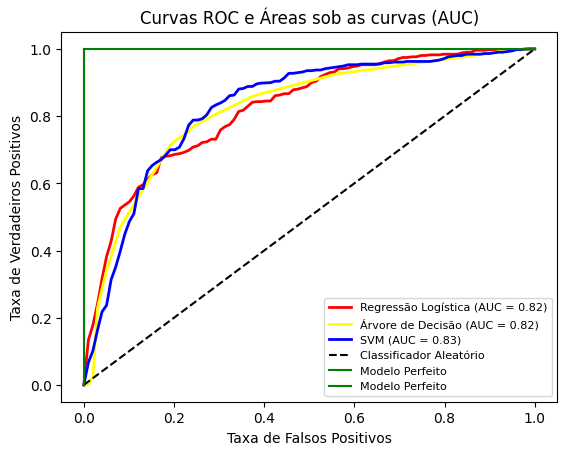

In [333]:
tpr_list_logreg = []
tpr_list_dt = []
tpr_list_svm = []

y_proba_logreg = random_search_logreg.predict_proba(x_test)[:, 1]
fpr_logreg, tpr_logreg, _ = roc_curve(y_test, y_proba_logreg)
roc_area_logreg = round(roc_auc_score(y_test,y_proba_logreg),3)

fprs_logreg = np.linspace(0, 1, 100)
tprs_logreg = np.interp(fprs_logreg, fpr_logreg, tpr_logreg)
tprs_logreg[0] = 0
tpr_list_logreg.append(tprs_logreg)

mean_tpr_logreg = np.mean(tpr_list_logreg, axis=0)
mean_auc_logreg = auc(fprs_logreg, mean_tpr_logreg)

plt.plot(fprs_logreg, mean_tpr_logreg, color='red', label=f'Regressão Logística (AUC = {mean_auc_logreg:.2f})', lw=2)

y_proba_dt = random_search_dt.predict_proba(x_test)[:, 1]
fpr_dt, tpr_dt, _ = roc_curve(y_test, y_proba_dt)
roc_area_dt = round(roc_auc_score(y_test, y_proba_dt),3)

fprs_dt= np.linspace(0, 1, 100)
tprs_dt = np.interp(fprs_dt, fpr_dt, tpr_dt)
tprs_dt[0] = 0
tpr_list_dt.append(tprs_dt)

mean_tpr_dt = np.mean(tpr_list_dt, axis=0)
mean_auc_dt = auc(fprs_dt, mean_tpr_dt)

plt.plot(fprs_dt, mean_tpr_dt, color='yellow', label=f'Árvore de Decisão (AUC = {mean_auc_dt:.2f})', lw=2)

y_proba_svm = random_search_svc.predict_proba(x_test)[:, 1]
fpr_svm, tpr_svm, _ = roc_curve(y_test, y_proba_svm)
roc_area_svm = round(roc_auc_score(y_test,y_proba_svm),3)

fprs_svm = np.linspace(0, 1, 100)
tprs_svm = np.interp(fprs_svm, fpr_svm, tpr_svm)
tprs_svm[0] = 0
tpr_list_svm.append(tprs_svm)

mean_tpr_svm = np.mean(tpr_list_svm, axis=0)
mean_auc_svm = auc(fprs_svm, mean_tpr_svm)

plt.plot(fprs_svm, mean_tpr_svm, color='blue', label=f'SVM (AUC = {mean_auc_svm:.2f})', lw=2)

plt.title('Curvas ROC e Áreas sob as curvas (AUC)')
plt.plot([0, 1], [0, 1], 'k--', label='Classificador Aleatório')
plt.plot([0, 0], [0, 1],  label='Modelo Perfeito',color='green')
plt.plot([0, 1], [1, 1], label='Modelo Perfeito',color='green')
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.legend(fontsize="8")
plt.show()

**Também será mostrado a curva ROC para cada fold e a curva ROC média no mesmo gráfico para uma melhor visualização das curvas.**

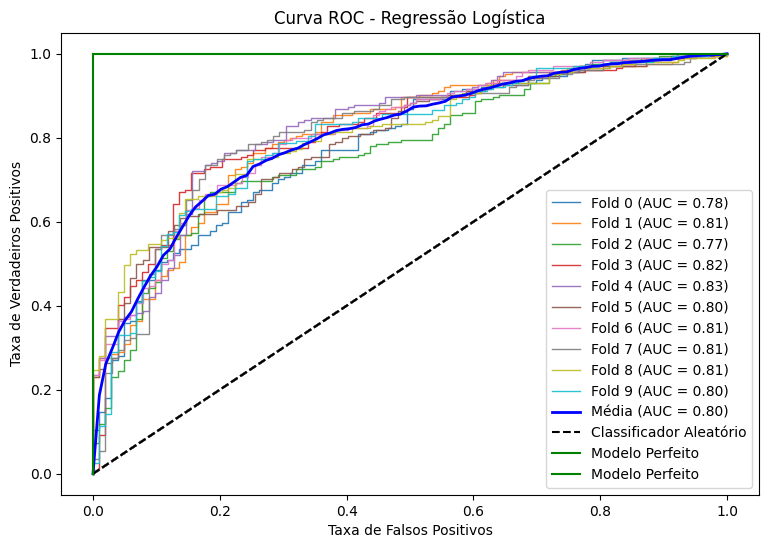

In [349]:
# Curva ROC - Regressão logística
plt.figure(figsize=(9, 6))

tpr_list = []

for fold, (train_index, test_index) in enumerate(cv.split(x_train, y_train)):
    x_fold_train, x_fold_test = x_train.iloc[train_index], x_train.iloc[test_index]
    y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]

    y_proba_logreg = random_search_logreg.predict_proba(x_fold_test)[:, 1]
    
    fpr, tpr, _ = roc_curve(y_fold_test, y_proba_logreg)
    roc_auc = auc(fpr, tpr)

    # Curva ROC para cada fold
    plt.plot(fpr, tpr, lw=1, alpha=0.9, label=f'Fold {fold} (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    
    # Interpolação
    fprs = np.linspace(0, 1, 100)
    tprs = np.interp(fprs, fpr, tpr)
    tprs[0] = 0
    tpr_list.append(tprs)

# Curva ROC média
mean_tpr = np.mean(tpr_list, axis=0)
mean_auc = auc(fprs, mean_tpr)

plt.plot(fprs, mean_tpr, color='b', label=f'Média (AUC = {mean_auc:.2f})', lw=2)

plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Curva ROC - Regressão Logística')
plt.plot([0, 1], [0, 1], 'k--', label='Classificador Aleatório')
plt.plot([0, 0], [0, 1],  label='Modelo Perfeito',color='green')
plt.plot([0, 1], [1, 1], label='Modelo Perfeito',color='green')
plt.legend(loc='lower right')
plt.show()



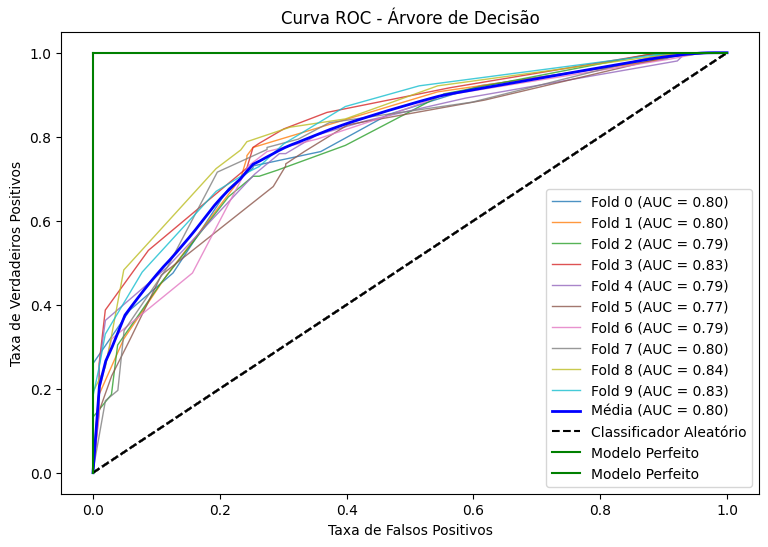

In [350]:
# Curva ROC - Árvore de decisão
plt.figure(figsize=(9, 6))

tpr_list = []

for fold, (train_index, test_index) in enumerate(cv.split(x_train, y_train)):
    x_fold_train, x_fold_test = x_train.iloc[train_index], x_train.iloc[test_index]
    y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]
    
    y_proba_dt = random_search_dt.predict_proba(x_fold_test)[:,1]
    
    fpr, tpr, _ = roc_curve(y_fold_test, y_proba_dt)
    roc_auc = auc(fpr, tpr)

    # Curva ROC para cada fold
    plt.plot(fpr, tpr, lw=1, alpha=0.8, label=f'Fold {fold} (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    
    # Interpolação
    fprs = np.linspace(0, 1, 100)
    tprs = np.interp(fprs, fpr, tpr)
    tprs[0] = 0
    tpr_list.append(tprs)

mean_tpr = np.mean(tpr_list, axis=0)
mean_auc = auc(fprs, mean_tpr)

# Curva ROC média 
plt.plot(fprs, mean_tpr, color='b', label=f'Média (AUC = {mean_auc:.2f})', lw=2)

plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Curva ROC - Árvore de Decisão')
plt.plot([0, 1], [0, 1], 'k--', label='Classificador Aleatório')
plt.plot([0, 0], [0, 1],  label='Modelo Perfeito',color='green')
plt.plot([0, 1], [1, 1], label='Modelo Perfeito',color='green')
plt.legend(loc='lower right')
plt.show()

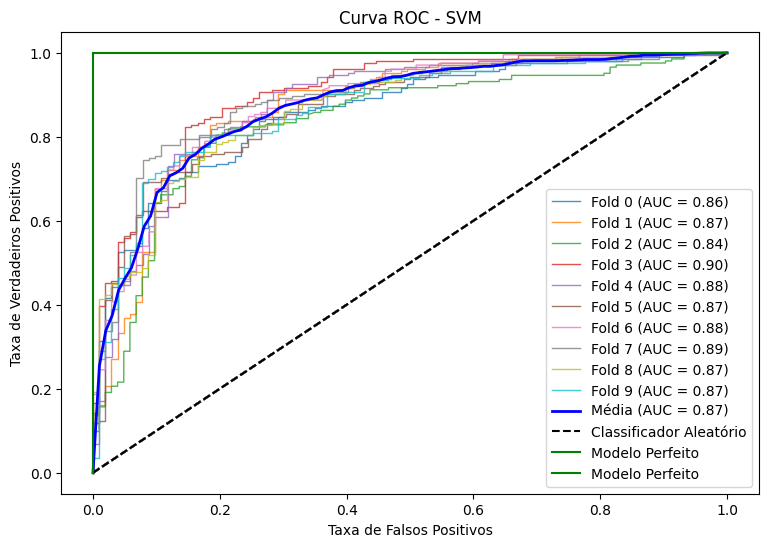

In [351]:
# Curva ROC - SVM
plt.figure(figsize=(9, 6))

tpr_list = []

for fold, (train_index, test_index) in enumerate(cv.split(x_train, y_train)):
    x_fold_train, x_fold_test = x_train.iloc[train_index], x_train.iloc[test_index]
    y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]

    y_proba_svm = random_search_svc.predict_proba(x_fold_test)[:, 1]
    
    fpr, tpr, _ = roc_curve(y_fold_test, y_proba_svm)
    roc_auc = auc(fpr, tpr)

    # Curva ROC para cada fold
    plt.plot(fpr, tpr, lw=1, alpha=0.8, label=f'Fold {fold} (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

    # Interpolação
    fprs = np.linspace(0, 1, 100)
    tprs = np.interp(fprs, fpr, tpr)
    tprs[0] = 0
    tpr_list.append(tprs)

mean_tpr = np.mean(tpr_list, axis=0)
mean_auc = auc(fprs, mean_tpr)

# Curva ROC média
plt.plot(fprs, mean_tpr, color='b', label=f'Média (AUC = {mean_auc:.2f})', lw=2)

plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Curva ROC - SVM')
plt.plot([0, 1], [0, 1], 'k--', label='Classificador Aleatório')
plt.plot([0, 0], [0, 1],  label='Modelo Perfeito',color='green')
plt.plot([0, 1], [1, 1], label='Modelo Perfeito',color='green')
plt.legend(loc='lower right')
plt.show()

**A curva ROC mostra a probabilidde de um resultado verdadeiro positivo (sensibilidade) *versus* a probalidade de um resultado falso positivo (1-especificidade) para diferentes pontos de corte. Portanto, quanto maiores os valores da sensibilidade e menores os valores da 1-especificidade, mais próximo a curva estará do modelo perfeito. Uma outra forma de ver isso é a partir do cálculo da área sob a curva. Pelo gráfico podemos ver que a área máxima é 1, ou seja, quanto maior a área abaixo da curva ROC, significa que ela está mais próxima de 1 e portanto melhor será o modelo.**  

**Observações:** 

**(1) curvas ROC e médias das AUCs para cada modelo;**

**(2) curvas ROC para cada fold e as respectivas médias das AUCs entre todos os folds.**

**Era de se esperar a pequena diferença entre os resultados de (1) e (2), já que train/test é diferente de train/teste para cada fold. Observe nas células abaixo para entender a quantidade de observações que estão sendo analisadas em cada caso.**

In [337]:
x_fold_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
247,6.0,0.29,0.21,1.30,0.055,42.0,168.0,0.99140,3.32,0.43,11.1
1563,6.6,0.31,0.38,16.05,0.058,16.0,165.0,0.99970,3.38,0.60,9.2
1862,9.4,0.42,0.32,6.50,0.027,20.0,167.0,0.99479,3.08,0.43,10.6
1403,7.6,0.32,0.34,18.35,0.054,44.0,197.0,1.00080,3.22,0.55,9.0
472,8.2,0.23,0.29,1.80,0.047,47.0,187.0,0.99330,3.13,0.50,10.2
...,...,...,...,...,...,...,...,...,...,...,...
3730,6.8,0.29,0.22,3.40,0.035,40.0,122.0,0.99024,3.09,0.47,12.3
3321,5.9,0.26,0.24,2.40,0.046,27.0,132.0,0.99234,3.63,0.73,11.3
3181,6.3,0.33,0.20,17.90,0.066,36.0,161.0,0.99910,3.14,0.51,8.8
137,7.5,0.29,0.31,8.95,0.055,20.0,151.0,0.99680,3.08,0.54,9.3


In [338]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
247,6.0,0.29,0.21,1.30,0.055,42.0,168.0,0.99140,3.32,0.43,11.1
1563,6.6,0.31,0.38,16.05,0.058,16.0,165.0,0.99970,3.38,0.60,9.2
1862,9.4,0.42,0.32,6.50,0.027,20.0,167.0,0.99479,3.08,0.43,10.6
1403,7.6,0.32,0.34,18.35,0.054,44.0,197.0,1.00080,3.22,0.55,9.0
472,8.2,0.23,0.29,1.80,0.047,47.0,187.0,0.99330,3.13,0.50,10.2
...,...,...,...,...,...,...,...,...,...,...,...
3730,6.8,0.29,0.22,3.40,0.035,40.0,122.0,0.99024,3.09,0.47,12.3
3321,5.9,0.26,0.24,2.40,0.046,27.0,132.0,0.99234,3.63,0.73,11.3
3181,6.3,0.33,0.20,17.90,0.066,36.0,161.0,0.99910,3.14,0.51,8.8
137,7.5,0.29,0.31,8.95,0.055,20.0,151.0,0.99680,3.08,0.54,9.3


In [339]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
2819,6.2,0.300,0.31,1.6,0.035,40.0,106.0,0.98914,3.26,0.39,12.9
1991,6.3,0.380,0.17,8.8,0.080,50.0,212.0,0.99803,3.47,0.66,9.4
1495,8.2,0.360,0.29,7.6,0.035,37.0,122.0,0.99390,3.16,0.34,12.0
2672,7.4,0.160,0.32,1.4,0.065,23.0,140.0,0.99134,3.06,0.47,11.4
1466,6.1,0.255,0.44,12.3,0.045,53.0,197.0,0.99670,3.24,0.54,9.5
...,...,...,...,...,...,...,...,...,...,...,...
1265,8.2,0.220,0.49,9.6,0.037,53.0,154.0,0.99510,3.02,0.33,10.6
3446,5.6,0.260,0.00,10.2,0.038,13.0,111.0,0.99315,3.44,0.46,12.4
1656,8.4,0.200,0.38,11.8,0.055,51.0,170.0,1.00040,3.34,0.82,8.9
800,5.1,0.420,0.01,1.5,0.017,25.0,102.0,0.98940,3.38,0.36,12.3


In [340]:
x_fold_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
3125,6.1,0.22,0.28,16.55,0.059,54.0,135.0,0.99665,3.20,0.38,10.5
3209,6.1,0.20,0.17,1.60,0.048,46.0,129.0,0.99100,3.30,0.43,11.4
1558,8.2,0.18,0.28,8.50,0.035,41.0,140.0,0.99520,3.04,0.37,10.1
936,6.3,0.55,0.45,13.00,0.047,33.0,182.0,0.99740,3.20,0.46,9.2
180,7.5,0.27,0.36,7.00,0.036,45.0,164.0,0.99390,3.03,0.33,11.0
...,...,...,...,...,...,...,...,...,...,...,...
3335,6.2,0.32,0.50,6.50,0.048,61.0,186.0,0.99480,3.19,0.45,9.6
3684,7.1,0.39,0.30,9.90,0.037,29.0,124.0,0.99414,3.07,0.42,10.9
3623,5.8,0.27,0.22,12.70,0.058,42.0,206.0,0.99460,3.32,0.38,12.3
3904,7.5,0.38,0.33,9.20,0.043,19.0,116.0,0.99444,3.08,0.42,11.4


In [341]:
y_fold_train

,opinion
247,1
1563,0
1862,0
1403,0
472,1
...,...
3730,1
3321,0
3181,0
137,0


In [342]:
y_fold_test

,opinion
3125,0
3209,1
1558,1
936,1
180,0
...,...
3335,0
3684,1
3623,1
3904,1


**<mark>De acordo com os resultados mostrados, tanto para as métricas quanto para a curva ROC, o melhor modelo é o SVM.**

# **Questão 5. Com a escolha do melhor modelo, use os dados de vinho tinto, presentes na base original e faça a inferência (não é para treinar novamente!!!) para saber quantos vinhos são bons ou ruins. Utilize o mesmo critério utilizado com os vinhos brancos, para comparar o desempenho do modelo. Ele funciona da mesma forma para essa nova base? Justifique.**

**De posse dos resultados vamos usar o melhor modelo para testar os vinhos tintos da base.**

In [343]:
# Separando a variável: vinho tinto 
df_red = df_wine.drop(df_wine.index[df_wine['type'] == 'white'])
df_red

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4898,red,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
4899,red,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
4900,red,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
4901,red,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4902,red,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2,6
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [344]:
# Criando a variável opinion e removendo a variável quality
df_red['opinion'] = df_red['quality'].apply(lambda x: 0 if x <= 5 else 1)
df_red = df_red.drop(columns=['quality','type'])

In [345]:
# Removendo dados duplicados
df_red_final = df_red.copy()
df_red_final = df_red_final.drop_duplicates().reset_index(drop=True)

In [346]:
# Removendo dados ausentes
df_red_final = df_red_final.dropna().reset_index(drop=True)

In [347]:
x_red = df_red_final.drop(['opinion'], axis=1)
y_red = df_red_final[['opinion']]

In [348]:
print(30*'=')
print('      SVM - BASE DE TESTE       ')
print(30*'=')

svm_pred_test = random_search_svc.predict(x_red)
    
acc_test = accuracy_score(y_red, svm_pred_test)
preci_test = precision_score(y_red, svm_pred_test)
recall_test = recall_score(y_red, svm_pred_test)
f1_test = f1_score(y_red, svm_pred_test)

acc_list_test.append(acc_test)
preci_list_test.append(preci_test)
recall_list_test.append(recall_test)
f1_list_test.append(f1_test)

mean_acc_test = np.mean(acc_list_test)
std_acc_test = np.std(acc_list_test)

mean_preci_test = np.mean(preci_list_test)
std_preci_test = np.std(preci_list_test)

mean_recall_test = np.mean(recall_list_test)
std_recall_test = np.std(recall_list_test)

mean_f1_test = np.mean(f1_list_test)
std_f1_test = np.std(f1_list_test)

print(f'Acurácia: {mean_acc_test:.4f}')
print(f'Precisão: {mean_preci_test:.4f}')
print(f'Recall: {mean_recall_test:.4f}')
print(f'F1-Score: {mean_f1_test:.4f}')

      SVM - BASE DE TESTE       
Acurácia: 0.7000
Precisão: 0.8217
Recall: 0.6039
F1-Score: 0.6520


**Os resultados mostram diferenças em torno de 10%, 20% e 30% para acurácia, f1-score e recall, respectivamente; a precisão manteve praticamente o mesmo resultado. As reduções já eram esperadas já que vinhos brancos possuem peculiaridades que não estão nos vinhos tintos - como este modelo foi treinado para vinhos brancos, então ele fica enviesado a tratar esse tipo de vinho. Para melhorarmos ainda mais o modelo, o ideal seria treinar a base total para que ele (o modelo) entenda as características diferentes de cada vinho e assim consiga suprimir ainda mais as diferenças apresentadas entre as métricas da base de treino e da base de teste.**